In [358]:
import numpy as np
import librosa
import pandas as pd
import glob
import scipy
import seaborn as sns

%matplotlib inline
import matplotlib.pyplot as plt
import librosa.display
import IPython.display as ipd
import crepe
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

from keras.models import Sequential
from keras.layers import Dense, Conv2D, Flatten, Dropout, MaxPooling2D, Activation


import os
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.style.use("ggplot")
%matplotlib inline

from tqdm import tqdm_notebook, tnrange
from itertools import chain
from skimage.io import imread, imshow, concatenate_images
from skimage.transform import resize
from skimage.morphology import label
from sklearn.model_selection import train_test_split

import tensorflow as tf

from keras.models import Model, load_model
from keras.layers import Input, BatchNormalization, Activation, Dense, Dropout
from keras.layers.core import Lambda, RepeatVector, Reshape
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D, GlobalMaxPool2D
from keras.layers.merge import concatenate, add
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img


In [67]:
def preprocess_audio_mel_T(audiotrack, sample_rate= SR, #log_specgram
                           step_size=192, 
#                            eps=1e-10, 
                           n_mels = 96,
                           Transpose = True):

    mel_spec = librosa.feature.melspectrogram(y=audiotrack, sr=sample_rate, n_mels= n_mels)
    mel_db = (librosa.power_to_db(mel_spec, ref=np.max) + 40)/40
    
    if Transpose:
         return mel_db.T
        
    else:
         return mel_db

In [6]:
def import_folder_audio(filepath):
    '''
    Function that imports all mp3 files present in a folder and transform them into audio at a 
    sample rate of 22050 (samples/second).
    Returns a list of 1D numpy arrays for each audio file.
    '''
    
    folder = glob.glob(filepath + "*.mp3")
    
    return [librosa.load(track) for track in folder]
    

In [41]:
def trim_audio(audio, start, stop, sr= 22050):
    
    audio = audio[sr * start: sr * stop]
    
    return audio


In [10]:
def track_length_seconds(audiofile):
    
    print('The track is {round(librosa.core.get_duration(y=audiofile), 2)} seconds long, containing {audiofile.shape[0] samples}')

In [50]:
def import_audio_file(audiopath):
    
    audio, sr = librosa.load(audiopath)
    return audio
    

In [21]:
SR = 22050

# Import audio files

#### Import audio files from folder

In [17]:
#train = import_folder_audio('path/')

Import test audio files

In [265]:
mix = import_audio_file('Data/eyeofthetiger/mix.mp3')
drums = import_audio_file('Data/eyeofthetiger/Drums.mp3')
drums2 = import_audio_file('Data/carryonwaywardson/Drums.mp3')

Trimming audio files

In [266]:
mix_30sec = trim_audio(mix, 50, 80)
drums_30sec = trim_audio(drums, 50, 80)
drums2_30sec = trim_audio(drums2, 50, 80)


In [57]:
mix_30sec.shape

(661500,)

#### Test audio 

In [58]:
ipd.Audio(mix_30sec, rate= SR)

In [59]:
ipd.Audio(drums_30sec, rate= SR)

# Creating Mel-Spectrogram


In [121]:
# Simple conversion

X = librosa.stft(drums_30sec)

Xdb = librosa.amplitude_to_db(abs(X))

Xdb.shape

(1025, 1292)

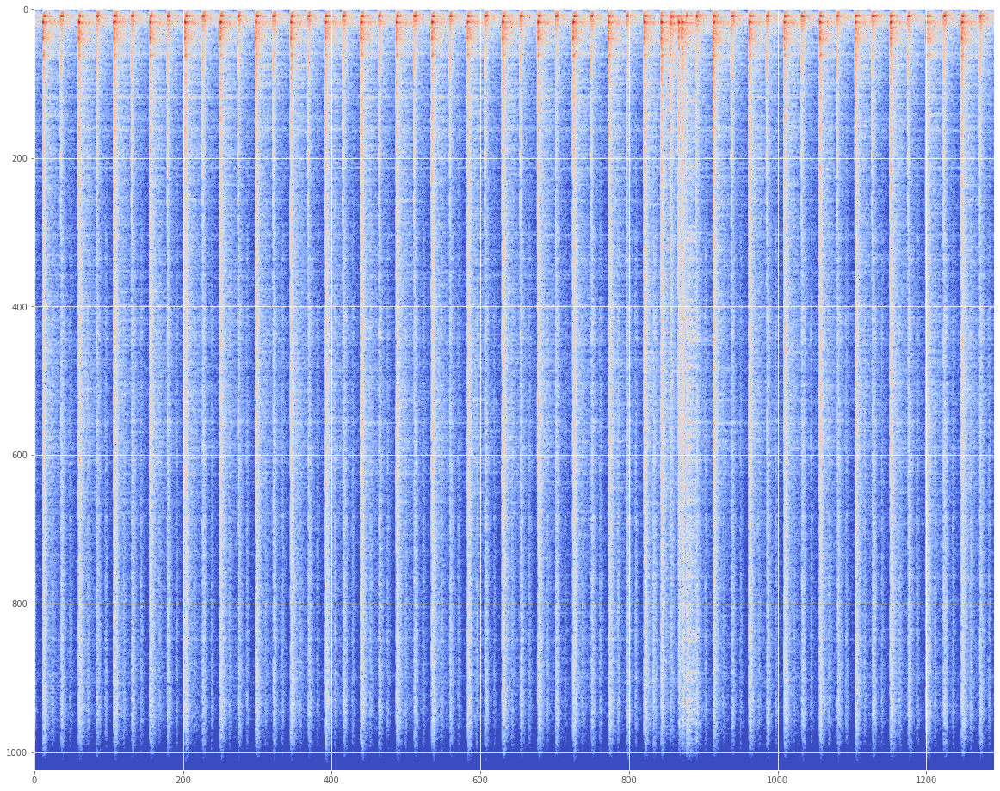

In [122]:
#Simple visualization

plt.figure(figsize=(20,20))
plt.imshow(Xdb, cmap='coolwarm')
plt.savefig('30s_drum_sample.png')

In [134]:
# Complex conversion

Xdb = preprocess_audio_mel_T(drums_30sec, Transpose= False, n_mels=4096)

In [135]:
Xdb.shape

(4096, 1292)

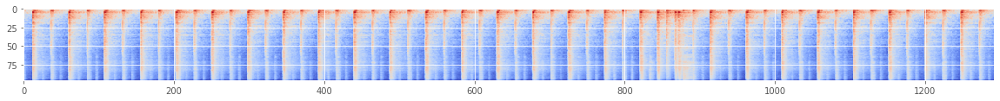

In [90]:
# Complex

plt.figure(figsize=(20,20))
plt.imshow(Xdb, cmap='coolwarm')

In [ ]:
### IMG SAVING:

my_dpi=192

# plt.figure(figsize=(800/my_dpi, 800/my_dpi), dpi=my_dpi) Showing the figure in the scale desired

# drums_mel = librosa.display.specshow(Xdb, sr=sr, 
#                                      x_axis='time', 
#                                      y_axis='hz'
                                    )

# plt.savefig('drums.png', 
#             dpi=my_dpi) # this saves the figure in the scale desired. My dpi = 192

# TRANSFORM INTO 128x128

(1025, 1292)

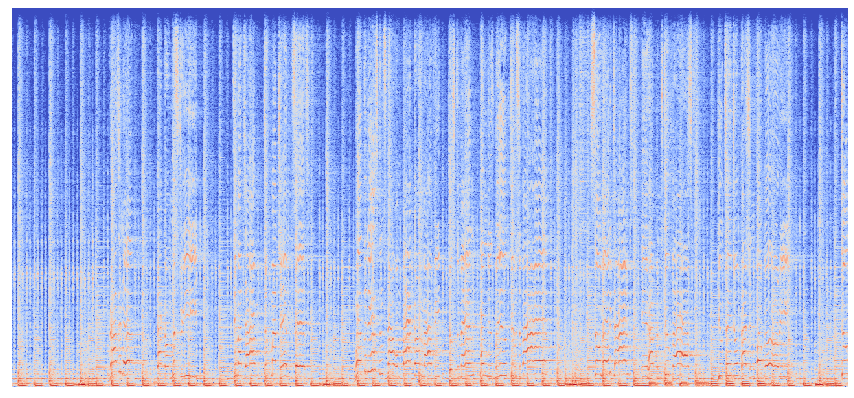

In [119]:
# creating mel spectrogram

X = librosa.stft(mix_30sec) # 1- The Short-time Fourier transform (STFT), is a Fourier-related transform used to determine the sinusoidal frequency and phase content of local sections of a signal as it changes over time.

Xdb = librosa.amplitude_to_db(abs(X)) # Convert an amplitude spectrogram to dB-scaled spectrogram.

plt.figure(figsize=(15, 7))
x_img = librosa.display.specshow(Xdb, sr=sr, 
#                          x_axis='time', 
#                          y_axis='hz'
                        )

Xdb.shape

In [ ]:
input_shape = Xdb.shape


# path_train = '../input/train/'
# path_test = '../input/test/'

In [12]:
data = []

for row in eye_songpath:
    y, sr = librosa.load(row, duration=30)  
    mel = librosa.feature.melspectrogram(y=y, sr=sr)
    data.append(mel)

In [37]:
len(data[0])

128

#  --- Importing img spectrogram files ---

In [ ]:
# Loop and 

# Prepare data for model

Normalization

In [18]:
# MinMax? simple division?

Train - Test data

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=2018)


# NORMALIZE 0-1 to -40, 40!!

# U-NET model

UNet is dedicated to solving this problem. The reason it is able to localise and distinguish borders is by doing classification on every pixel, so the input and output share the same size. 

In [106]:
def conv2d_block(input_tensor, n_filters, kernel_size=3, batchnorm=True):
    
    # first layer
    x = Conv2D(filters=n_filters, kernel_size=(kernel_size, kernel_size), kernel_initializer="he_normal",
               padding="same")(input_tensor)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation("relu")(x)
    
    # second layer
    x = Conv2D(filters=n_filters, kernel_size=(kernel_size, kernel_size), kernel_initializer="he_normal",
               padding="same")(x)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation("relu")(x)
    
    return x

In [300]:
def get_unet(audio_input, n_filters=16, dropout=0.5, batchnorm=True):
    
    # contracting path
    
    c1 = conv2d_block(audio_input, n_filters=n_filters*1, kernel_size=3, batchnorm=batchnorm)
    p1 = MaxPooling2D((2, 2)) (c1)
    p1 = Dropout(dropout*0.5)(p1)

    c2 = conv2d_block(p1, n_filters=n_filters*2, kernel_size=3, batchnorm=batchnorm)
    p2 = MaxPooling2D((2, 2)) (c2)
    p2 = Dropout(dropout)(p2)

    c3 = conv2d_block(p2, n_filters=n_filters*4, kernel_size=3, batchnorm=batchnorm)
    p3 = MaxPooling2D((2, 2)) (c3)
    p3 = Dropout(dropout)(p3)

    c4 = conv2d_block(p3, n_filters=n_filters*8, kernel_size=3, batchnorm=batchnorm)
    p4 = MaxPooling2D(pool_size=(2, 2)) (c4)
    p4 = Dropout(dropout)(p4)
    
    c5 = conv2d_block(p4, n_filters=n_filters*16, kernel_size=3, batchnorm=batchnorm)
    
        # expansive path
        
    u6 = Conv2DTranspose(n_filters*8, (3, 3), strides=(2, 2), padding='same') (c5)
    u6 = concatenate([u6, c4])
    u6 = Dropout(dropout)(u6)
    c6 = conv2d_block(u6, n_filters=n_filters*8, kernel_size=3, batchnorm=batchnorm)

    u7 = Conv2DTranspose(n_filters*4, (3, 3), strides=(2, 2), padding='same') (c6)
    u7 = concatenate([u7, c3])
    u7 = Dropout(dropout)(u7)
    c7 = conv2d_block(u7, n_filters=n_filters*4, kernel_size=3, batchnorm=batchnorm)

    u8 = Conv2DTranspose(n_filters*2, (3, 3), strides=(2, 2), padding='same') (c7)
    u8 = concatenate([u8, c2])
    u8 = Dropout(dropout)(u8)
    c8 = conv2d_block(u8, n_filters=n_filters*2, kernel_size=3, batchnorm=batchnorm)

    u9 = Conv2DTranspose(n_filters*1, (3, 3), strides=(2, 2), padding='same') (c8)
    u9 = concatenate([u9, c1], axis=3)
    u9 = Dropout(dropout)(u9)
    c9 = conv2d_block(u9, n_filters=n_filters*1, kernel_size=3, batchnorm=batchnorm)
    
    outputs = Conv2D(1, (1, 1), activation='sigmoid') (c9)
    model = Model(inputs=[audio_input], outputs=[outputs])
    return model

Since dropout seems not to work well for me in this competition we set it to a low value. Batchnormalization improves the training quite a lot.



In [288]:

X = librosa.stft(mix_30sec)
train = librosa.amplitude_to_db(abs(X))

X = librosa.stft(drums_30sec)
test = librosa.amplitude_to_db(abs(X))


In [289]:
train.shape

(1025, 1292)

In [299]:
a = 1292 / 32

print(32*40)

1280


In [301]:
train = train[:1024, : 1280]
test = train[:1024, : 1280]

In [302]:
audio_input = Input((train.shape[0], train.shape[1], 1), name='audio_input')
model = get_unet(audio_input, n_filters=16, dropout=0.05, batchnorm=True)

model.compile(optimizer=Adam(), loss="binary_crossentropy", metrics=["accuracy"])
model.summary()

Model: "model_14"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
audio_input (InputLayer)        (None, 1024, 1280, 1 0                                            
__________________________________________________________________________________________________
conv2d_427 (Conv2D)             (None, 1024, 1280, 1 160         audio_input[0][0]                
__________________________________________________________________________________________________
batch_normalization_413 (BatchN (None, 1024, 1280, 1 64          conv2d_427[0][0]                 
__________________________________________________________________________________________________
activation_413 (Activation)     (None, 1024, 1280, 1 0           batch_normalization_413[0][0]    
___________________________________________________________________________________________

# Evaluation

see

In [308]:
input_train = train.reshape((-1, train.shape[0], train.shape[1], 1))
input_test = test.reshape((-1, train.shape[0], train.shape[1], 1))

print(input_train.shape, input_test.shape)


(1, 1024, 1280, 1) (1, 1024, 1280, 1)


Epoch 1/100
1/1 [==============================] - 13s 13s/step - loss: -7.9389 - accuracy: 0.0000e+00
Epoch 2/100
1/1 [==============================] - 13s 13s/step - loss: -9.6644 - accuracy: 0.0000e+00
Epoch 3/100
1/1 [==============================] - 13s 13s/step - loss: -11.1481 - accuracy: 0.0000e+00
Epoch 4/100
1/1 [==============================] - 14s 14s/step - loss: -12.4571 - accuracy: 0.0000e+00
Epoch 5/100
1/1 [==============================] - 15s 15s/step - loss: -13.6672 - accuracy: 0.0000e+00
Epoch 6/100
1/1 [==============================] - 13s 13s/step - loss: -14.8016 - accuracy: 0.0000e+00
Epoch 7/100
1/1 [==============================] - 13s 13s/step - loss: -15.8597 - accuracy: 0.0000e+00
Epoch 8/100
1/1 [==============================] - 13s 13s/step - loss: -16.8024 - accuracy: 0.0000e+00
Epoch 9/100
1/1 [==============================] - 13s 13s/step - loss: -17.6472 - accuracy: 0.0000e+00
Epoch 10/100
1/1 [==============================] - 13s 13s/step -

Epoch 80/100
1/1 [==============================] - 14s 14s/step - loss: -43.3251 - accuracy: 0.0000e+00
Epoch 81/100
1/1 [==============================] - 14s 14s/step - loss: -43.6027 - accuracy: 0.0000e+00
Epoch 82/100
1/1 [==============================] - 24s 24s/step - loss: -43.8827 - accuracy: 0.0000e+00
Epoch 83/100
1/1 [==============================] - 21s 21s/step - loss: -44.1564 - accuracy: 0.0000e+00
Epoch 84/100
1/1 [==============================] - 21s 21s/step - loss: -44.4349 - accuracy: 0.0000e+00
Epoch 85/100
1/1 [==============================] - 21s 21s/step - loss: -44.7148 - accuracy: 0.0000e+00
Epoch 86/100
1/1 [==============================] - 22s 22s/step - loss: -44.9956 - accuracy: 0.0000e+00
Epoch 87/100
1/1 [==============================] - 21s 21s/step - loss: -45.2801 - accuracy: 0.0000e+00
Epoch 88/100
1/1 [==============================] - 22s 22s/step - loss: -45.5577 - accuracy: 0.0000e+00
Epoch 89/100
1/1 [==============================] - 18s

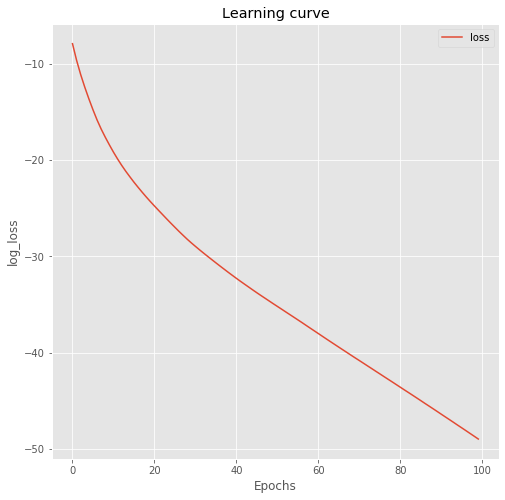

In [311]:
callbacks = [
    EarlyStopping(patience=10, verbose=1),
    ReduceLROnPlateau(factor=0.1, patience=3, min_lr=0.00001, verbose=0),
    ModelCheckpoint('model-tgs-salt.h5', verbose=1, save_best_only=True, save_weights_only=True)
]

results = model.fit(input_train, input_test, batch_size=32, epochs=100, callbacks=callbacks,
                     #validation_data=(train, test)
                   )

plt.figure(figsize=(8, 8))
plt.title("Learning curve")
plt.plot(results.history["loss"], label="loss")
# plt.plot(results.history["val_loss"], label="val_loss")
# plt.plot(np.argmin(results.history["val_loss"]), np.min(results.history["val_loss"]), marker="x", color="r", label="best model")
plt.xlabel("Epochs")
plt.ylabel("log_loss")
plt.legend();


In [312]:
predicted = model.predict(input_test)

In [313]:
predicted.shape

(1, 1024, 1280, 1)

In [314]:
input_test.shape

(1, 1024, 1280, 1)

hear

In [315]:
predicted = predicted.reshape(1024, 1280)

In [316]:
predicted.shape

(1024, 1280)

In [317]:
test.shape

(1024, 1280)

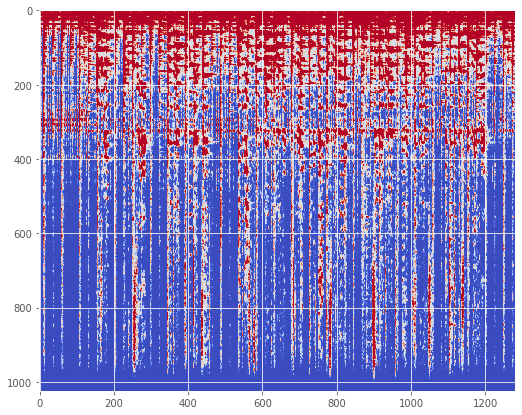

In [356]:
plt.figure(figsize=(15, 7))
plt.imshow(predicted, cmap='coolwarm')
plt.savefig('30s_predicted_sample.png')

In [371]:
predicted.min()

0.0

In [372]:
def scale(x, out_range=(-1, 1)):
    domain = np.min(x), np.max(x)
    y = (x - (domain[1] + domain[0]) / 2) / (domain[1] - domain[0])
    return y * (out_range[1] - out_range[0]) + (out_range[1] + out_range[0]) / 2


In [373]:
test = predicted

In [374]:
test[0] = scale(test[0], out_range=(-40,40))

In [375]:
test[1] = scale(test[1], out_range=(-40,40))

In [379]:
test

array([[ 1.3598155e+01,  2.4835430e+01,  4.7352500e+00, ...,
        -1.0644554e+01, -7.4253187e+00, -1.0918713e+01],
       [ 2.1371876e+01,  3.4820282e+01,  1.1926344e+01, ...,
         2.5504295e+01,  1.7100313e+01,  1.3604021e+01],
       [ 8.5062730e-01,  9.8663837e-01,  8.2453483e-01, ...,
         9.9205697e-01,  9.8497355e-01,  9.0578258e-01],
       ...,
       [ 1.0181069e-03,  6.2584877e-07,  5.9604645e-08, ...,
         8.9406967e-08,  1.4901161e-07,  1.9368529e-04],
       [ 1.1507571e-03,  1.4305115e-06,  2.0861626e-07, ...,
         1.4901161e-07,  2.3841858e-07,  3.3810735e-04],
       [ 8.7699294e-03,  2.1323562e-04,  2.9206276e-05, ...,
         2.3961067e-05,  5.0306320e-05,  1.1181295e-02]], dtype=float32)

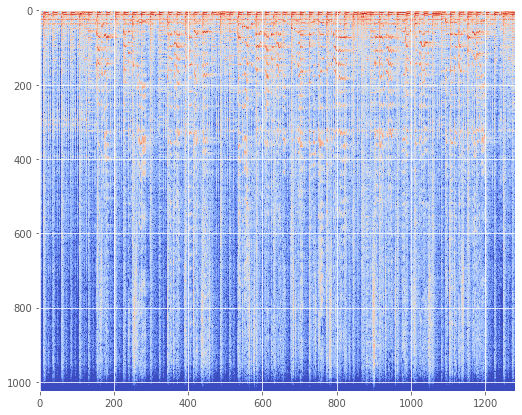

In [357]:
plt.figure(figsize=(15, 7))
plt.imshow(train, cmap='coolwarm')

In [364]:
predicted.min()

0.0

In [380]:
audio = librosa.feature.inverse.mel_to_audio(test, sr=22050, n_fft=2048, hop_length=512, win_length=None, window='hann', 
                                     center=True, pad_mode='reflect', 
                                     power=2.0, n_iter=32, length=None, dtype='float')

In [381]:
ipd.Audio(audio, rate= SR)

Text(0.5, 0, 'Frequency (Hz)')

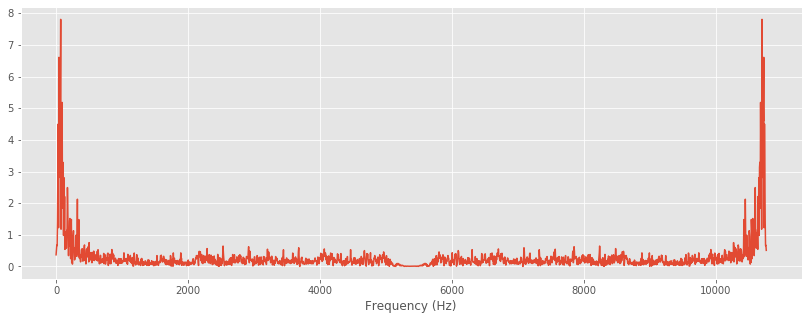

In [347]:
y = scipy.fft(audio[0:2000])
y_mag = np.absolute(y)
f = np.linspace(0, 22050, 4096)  # frequency variable

plt.figure(figsize=(14, 5))
plt.plot(f[:2000], X_mag[:2000]) # magnitude spectrum
plt.xlabel('Frequency (Hz)')

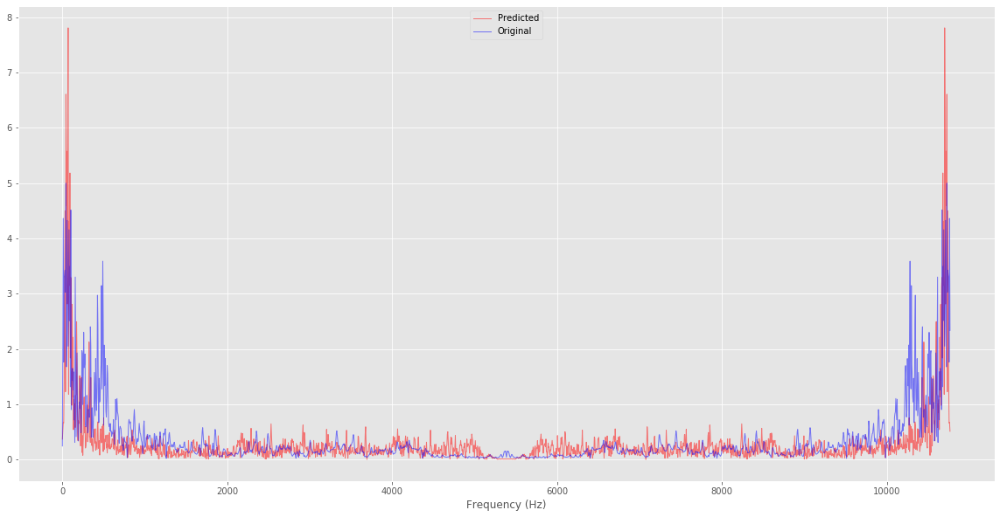

In [355]:
X = scipy.fft(drums_30sec[0:2000])
X_mag = np.absolute(X)
f = np.linspace(0, 22050, 4096)  # frequency variable

plt.figure(figsize=(20, 10))
plt.plot(f[:2000], X_mag[:2000], c='red', alpha= 0.5, linewidth=1) 
plt.plot(f[:2000], y_mag[:2000], c='blue', alpha=0.5, linewidth=1)# magnitude spectrum
plt.xlabel('Frequency (Hz)')
plt.legend(['Predicted', 'Original'])

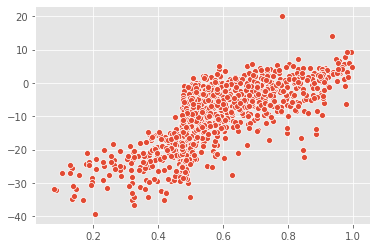

In [361]:
sns.scatterplot(predicted[1], test[1])

In [319]:
audio = librosa.feature.inverse.mel_to_audio(predicted, sr=22050, n_fft=2048, hop_length=512, win_length=None, window='hann', 
                                     center=True, pad_mode='reflect', 
                                     power=2.0, n_iter=32, length=None, dtype='float')

In [320]:
ipd.Audio(audio, rate= SR)

In [354]:
librosa.output.write_wav('2D conv prediction.wav', audio, SR)


In [282]:
ipd.Audio(test, rate= SR)

In [ ]:
#sine wave

In [ ]:
#sine wave detail comparison

In [ ]:
# espectrogram

In [ ]:
# Load best model
model.load_weights('model-tgs-salt.h5')

In [ ]:
# Evaluate on validation set (this must be equals to the best log_loss)
model.evaluate(X_valid, y_valid, verbose=1)

In [ ]:
# Predict on train, val and test
preds_train = model.predict(X_train, verbose=1)
preds_val = model.predict(X_valid, verbose=1)

# Threshold predictions
preds_train_t = (preds_train > 0.5).astype(np.uint8)
preds_val_t = (preds_val > 0.5).astype(np.uint8)

# Conversion to audio

In [ ]:
librosa.feature.inverse.mel_to_audio(mel_drums, sr=22050)

# Resources

[WAVE-U-NET : A multi-scale neural network for end-to-end audio source separation](https://arxiv.org/pdf/1806.03185.pdf)

[Voice separation with deep U-NET Convolutional Networks](https://openaccess.city.ac.uk/id/eprint/19289/1/7bb8d1600fba70dd79408775cd0c37a4ff62.pdf)

[UNet Guide line by line](https://towardsdatascience.com/unet-line-by-line-explanation-9b191c76baf5)

[Segmenting images with Keras](https://www.depends-on-the-definition.com/unet-keras-segmenting-images/)

[Batch normalization in Neural Networks](https://towardsdatascience.com/batch-normalization-in-neural-networks-1ac91516821c)

In [259]:
def is_balanced(source, caps):
    
    caps = [sign for sign in caps]
    source = [letter for letter in source]    
    
    lst = []
    order = []
    
    
    for item in source:
        if item in caps:
            lst.append(True)
            source.remove(item)
        else:
            lst.append(False)
            
    print(all(lst))

In [260]:
    # check index_caps[0] < index_caps[1]
    # check index_caps[2] < index_caps[3]

print(is_balanced("(Sensei says yes!)", "()"))  #True
is_balanced("(Sensei says no!", "()")           #False

is_balanced("(Sensei [says] yes!)", "()[]")     #True
is_balanced("(Sensei [says) no!]", "()[]")      #False

is_balanced("Sensei says -yes-!", "--")         #True
is_balanced("Sensei -says no!", "--")           #False

False
None
False
False
False
False
False
